In [47]:
!pip install -q  kaggle
! gdown --id 1Kr1QJBppA2sGA5hw5jvSpKlen9Yt3tEl

Downloading...
From: https://drive.google.com/uc?id=1Kr1QJBppA2sGA5hw5jvSpKlen9Yt3tEl
To: /content/kaggle.json
100% 63.0/63.0 [00:00<00:00, 103kB/s]


In [48]:
mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [49]:
cp kaggle.json ~/.kaggle/

In [50]:
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download -d akash14/house-price-dataset
!unzip house-price-dataset.zip

house-price-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  house-price-dataset.zip
replace Participants_Data_HPP/Test.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: Participants_Data_HPP/Test.csv  
replace Participants_Data_HPP/Train.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: Participants_Data_HPP/Train.csv  
replace Participants_Data_HPP/sample_submission.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: Participants_Data_HPP/sample_submission.csv  


In [51]:
# Load libraries
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.linear_model import LinearRegression

In [52]:
df = pd.read_csv('/content/Participants_Data_HPP/Train.csv')
df_test = pd.read_csv('/content/Participants_Data_HPP/Test.csv')
print('The shape of dataset is {}'.format(df.shape))
df.head()

The shape of dataset is (29451, 12)


,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
0,Owner,0,0,2,BHK,1300.236407,1,1,"Ksfc Layout,Bangalore",12.969910,77.597960,55.0
1,Dealer,0,0,2,BHK,1275.000000,1,1,"Vishweshwara Nagar,Mysore",12.274538,76.644605,51.0
2,Owner,0,0,2,BHK,933.159722,1,1,"Jigani,Bangalore",12.778033,77.632191,43.0
3,Owner,0,1,2,BHK,929.921143,1,1,"Sector-1 Vaishali,Ghaziabad",28.642300,77.344500,62.5
4,Dealer,1,0,2,BHK,999.009247,0,1,"New Town,Kolkata",22.592200,88.484911,60.5


In [53]:
df.head()

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
0,Owner,0,0,2,BHK,1300.236407,1,1,"Ksfc Layout,Bangalore",12.969910,77.597960,55.0
1,Dealer,0,0,2,BHK,1275.000000,1,1,"Vishweshwara Nagar,Mysore",12.274538,76.644605,51.0
2,Owner,0,0,2,BHK,933.159722,1,1,"Jigani,Bangalore",12.778033,77.632191,43.0
3,Owner,0,1,2,BHK,929.921143,1,1,"Sector-1 Vaishali,Ghaziabad",28.642300,77.344500,62.5
4,Dealer,1,0,2,BHK,999.009247,0,1,"New Town,Kolkata",22.592200,88.484911,60.5


In [54]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
df['POSTED_BY']=labelencoder.fit_transform(df['POSTED_BY'])
df['RESALE']=labelencoder.fit_transform(df['RESALE'])
df.head()

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
0,2,0,0,2,BHK,1300.236407,1,1,"Ksfc Layout,Bangalore",12.969910,77.597960,55.0
1,1,0,0,2,BHK,1275.000000,1,1,"Vishweshwara Nagar,Mysore",12.274538,76.644605,51.0
2,2,0,0,2,BHK,933.159722,1,1,"Jigani,Bangalore",12.778033,77.632191,43.0
3,2,0,1,2,BHK,929.921143,1,1,"Sector-1 Vaishali,Ghaziabad",28.642300,77.344500,62.5
4,1,1,0,2,BHK,999.009247,0,1,"New Town,Kolkata",22.592200,88.484911,60.5


In [55]:
df.drop(['BHK_OR_RK','LONGITUDE','LATITUDE','ADDRESS'], axis = 1)

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,READY_TO_MOVE,RESALE,TARGET(PRICE_IN_LACS)
0,2,0,0,2,1300.236407,1,1,55.0
1,1,0,0,2,1275.000000,1,1,51.0
2,2,0,0,2,933.159722,1,1,43.0
3,2,0,1,2,929.921143,1,1,62.5
4,1,1,0,2,999.009247,0,1,60.5
...,...,...,...,...,...,...,...,...
29446,2,0,0,3,2500.000000,1,1,45.0
29447,2,0,0,2,769.230769,1,1,16.0
29448,1,0,0,2,1022.641509,1,1,27.1
29449,2,0,0,2,927.079009,1,1,67.0


In [56]:
feature_cols = ['UNDER_CONSTRUCTION', 'BHK_NO.','SQUARE_FT','READY_TO_MOVE', 'TARGET(PRICE_IN_LACS)']
X = df[feature_cols] # Features
y = df.RESALE # Target variable

In [57]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # 70% training and 30% test

In [58]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
clf.score(X_train,y_train)

0.9980596652922629

In [59]:
from sklearn.tree import export_graphviz
from io import StringIO
import six
import sys
sys.modules['sklearn.externals.six'] = six 
from IPython.display import Image  
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Resale.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.370755 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.370755 to fit



In [60]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.94013128112268


In [61]:
classifier_tree = DecisionTreeClassifier()
y_predict = classifier_tree.fit(X_train, y_train).predict(X_test)

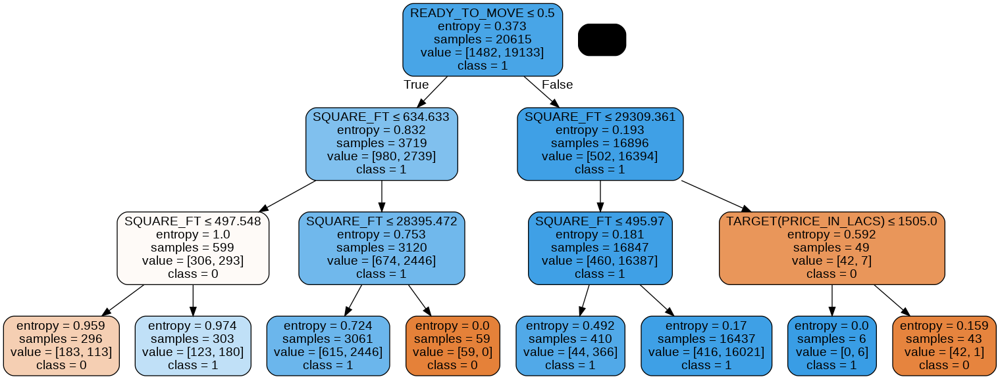

In [62]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes.png')
Image(graph.create_png())